# Importing Necessary Libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
!unzip "/content/drive/MyDrive/ham10000/dlprojdata.zip" -d "/content/dlprojdata"


Streaming output truncated to the last 5000 lines.
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029326.jpg  
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029327.jpg  
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029328.jpg  
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029329.jpg  
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029330.jpg  
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029331.jpg  
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029332.jpg  
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029333.jpg  
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029334.jpg  
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029335.jpg  
  inflating: /content/dlprojdata/dlprojdata/HAM10000_images_part_2/ISIC_0029336.jpg  
  i

In [3]:
from google.colab import files
uploaded = files.upload()


Saving ISIC2018_Task3_Training_GroundTruth.zip to ISIC2018_Task3_Training_GroundTruth.zip


In [4]:
import zipfile

with zipfile.ZipFile("ISIC2018_Task3_Training_GroundTruth.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/isic_labels")


In [8]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
import cv2

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import itertools

from glob import glob
from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from skimage.io import imread


In [11]:
import pandas as pd
import os

# Set the correct base path in Colab
base_skin_dir = '/content/dlprojdata/dlprojdata'

# Correct way to load the metadata CSV
metadata_path = os.path.join(base_skin_dir, 'HAM10000_metadata.csv')
skin_df = pd.read_csv(metadata_path)

skin_df.head()


,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [12]:
import pandas as pd

csv_path = '/content/isic_labels/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
df_labels = pd.read_csv(csv_path)
df_labels['label'] = df_labels.iloc[:, 1:].idxmax(axis=1).str.upper()
df_labels.set_index('image', inplace=True)

df_labels.head()

,MEL,NV,BCC,AKIEC,BKL,DF,VASC,label
image,,,,,,,,
ISIC_0024306,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NV
ISIC_0024307,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NV
ISIC_0024308,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NV
ISIC_0024309,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NV
ISIC_0024310,1.0,0.0,0.0,0.0,0.0,0.0,0.0,MEL


In [13]:
skin_df.tail()

,lesion_id,image_id,dx,dx_type,age,sex,localization
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face
10014,HAM_0003521,ISIC_0032258,mel,histo,70.0,female,back


In [14]:
skin_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
dtypes: float64(1), object(6)
memory usage: 547.8+ KB


# Data Preprocessing

In [15]:
imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(base_skin_dir, '*', '*.jpg'))}

lesion_type_dict = {
    'nv': 'Melanocytic_nevi',
    'mel': 'melanoma',
    'bkl': 'Benign_keratosis-like_lesions',
    'bcc': 'Basal_cell_carcinoma',
    'akiec': 'Actinic_keratoses',
    'vasc': 'Vascular_lesions',
    'df': 'Dermatofibroma'
}

lesion_danger = {
    'nv': 0,
    'mel': 1,
    'bkl': 0,
    'bcc': 1,
    'akiec': 1,
    'vasc': 0,
    'df': 0
}

In [20]:
df1=skin_df.copy()
df1['lesion_type'] = df1['dx'].map(lesion_type_dict)
df1["path"] = skin_df["image_id"].map(imageid_path_dict.get)
df1['malignant'] = df1['dx'].map(lesion_danger)
df1['lesion_ID'] = pd.Categorical(df1['lesion_type']).codes


df1.head()


,lesion_id,image_id,dx,dx_type,age,sex,localization,lesion_type,path,malignant,lesion_ID
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,Benign_keratosis-like_lesions,/content/dlprojdata/dlprojdata/HAM10000_images...,0,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,Benign_keratosis-like_lesions,/content/dlprojdata/dlprojdata/HAM10000_images...,0,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,Benign_keratosis-like_lesions,/content/dlprojdata/dlprojdata/HAM10000_images...,0,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,Benign_keratosis-like_lesions,/content/dlprojdata/dlprojdata/HAM10000_images...,0,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,Benign_keratosis-like_lesions,/content/dlprojdata/dlprojdata/HAM10000_images...,0,2


In [17]:
df1.tail()

,lesion_id,image_id,dx,dx_type,age,sex,localization,lesion_type,path,malignant,lesion_ID
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen,Actinic_keratoses,/content/dlprojdata/dlprojdata/HAM10000_images...,1,0
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen,Actinic_keratoses,/content/dlprojdata/dlprojdata/HAM10000_images...,1,0
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen,Actinic_keratoses,/content/dlprojdata/dlprojdata/HAM10000_images...,1,0
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face,Actinic_keratoses,/content/dlprojdata/dlprojdata/HAM10000_images...,1,0
10014,HAM_0003521,ISIC_0032258,mel,histo,70.0,female,back,melanoma,/content/dlprojdata/dlprojdata/HAM10000_images...,1,6


In [18]:
df1.isnull().sum()

,0
lesion_id,0
image_id,0
dx,0
dx_type,0
age,57
sex,0
localization,0
lesion_type,0
path,0
malignant,0


In [19]:
df1['age'] = df1.groupby('dx')['age'].transform(lambda x: x.fillna(x.median()))


In [21]:
df1.isnull().sum()

,0
lesion_id,0
image_id,0
dx,0
dx_type,0
age,57
sex,0
localization,0
lesion_type,0
path,0
malignant,0


# Data Visualization

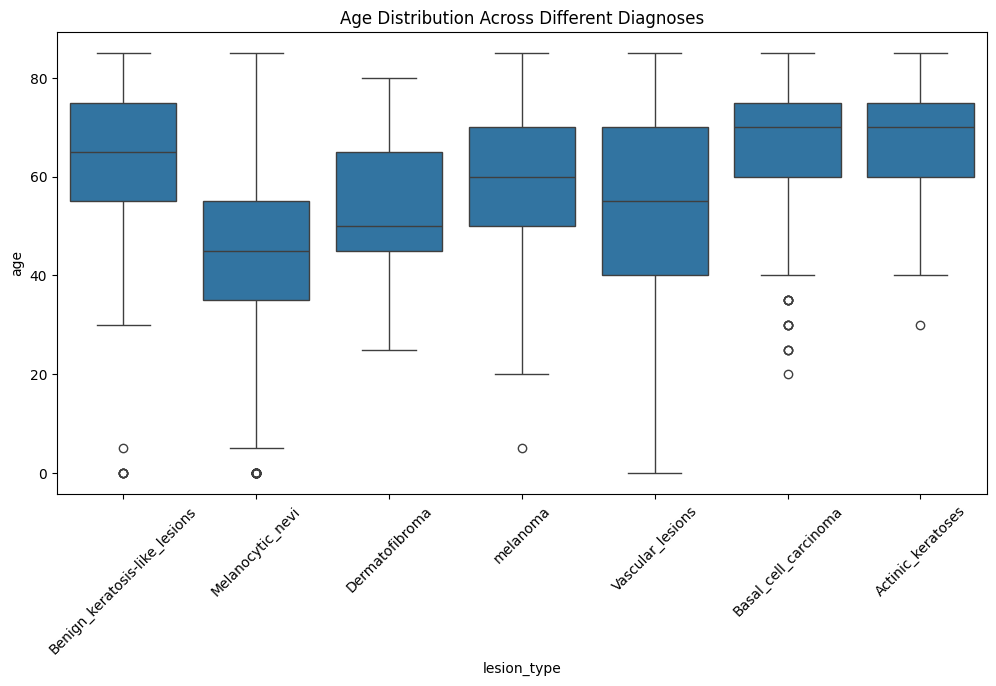

In [22]:
plt.figure(figsize=(12,6))
sns.boxplot(x='lesion_type', y='age', data=df1)
plt.xticks(rotation=45)
plt.title("Age Distribution Across Different Diagnoses")
plt.show()

<ipython-input-23-2dc158407649>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='age_group', data=df1, order=labels, palette="coolwarm")


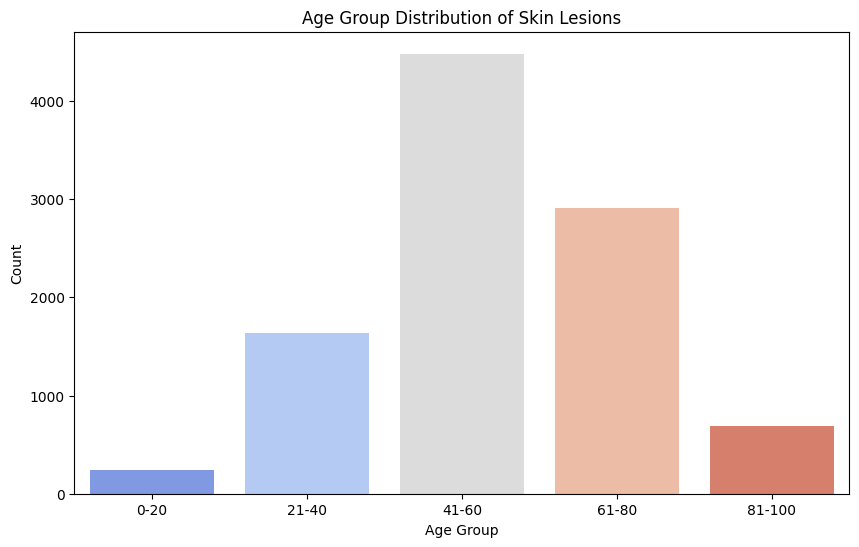

In [23]:

bins = [0, 20, 40, 60, 80, 100]
labels = ['0-20', '21-40', '41-60', '61-80', '81-100']


df1['age_group'] = pd.cut(df1['age'], bins=bins, labels=labels, right=False)

plt.figure(figsize=(10, 6))
sns.countplot(x='age_group', data=df1, order=labels, palette="coolwarm")

plt.title("Age Group Distribution of Skin Lesions")
plt.xlabel("Age Group")
plt.ylabel("Count")
plt.show()

<Axes: title={'center': 'Counts for each type of Lesions'}, xlabel='lesion_type'>

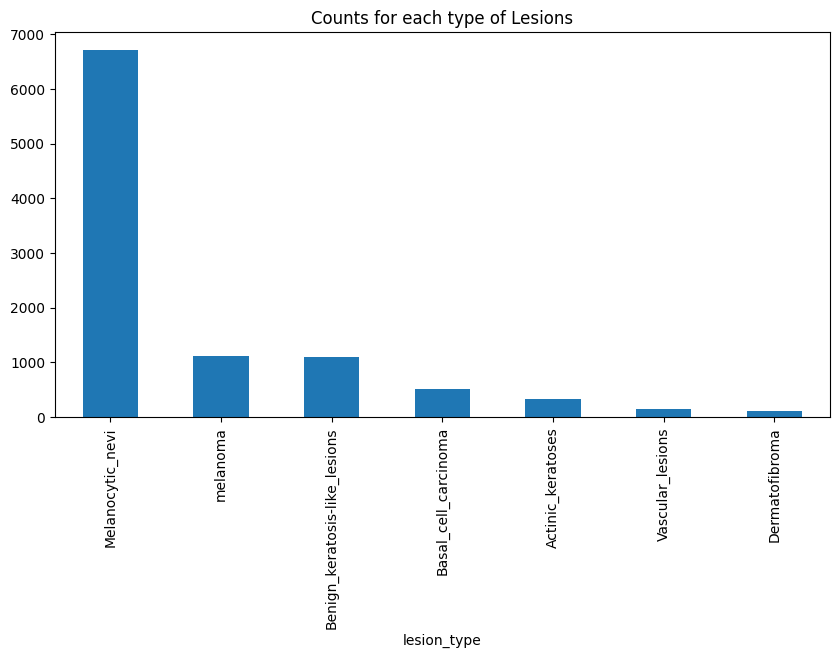

In [24]:
fig, ax1 = plt.subplots(1,1,figsize=(10,5))
df1['lesion_type'].value_counts().plot(kind="bar", ax=ax1, title="Counts for each type of Lesions")

<Axes: title={'center': 'Benign vs Malignant'}, xlabel='malignant'>

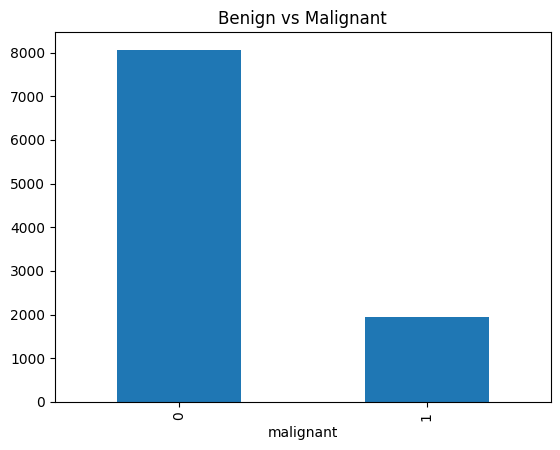

In [25]:
df1["malignant"].value_counts().plot(kind="bar", title="Benign vs Malignant")


<Axes: title={'center': 'Location of Lesions'}, xlabel='localization'>

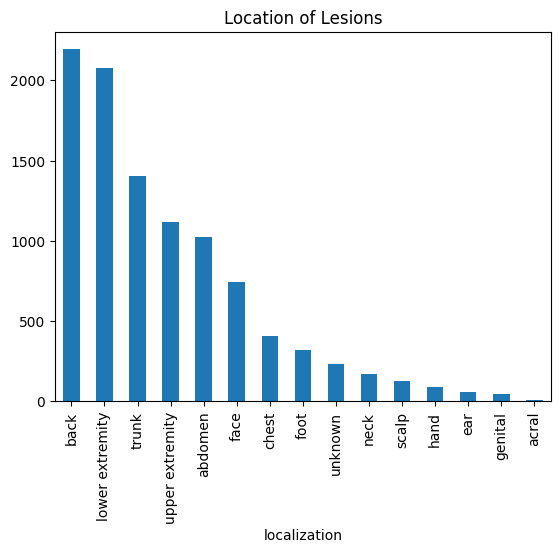

In [26]:

df1["localization"].value_counts().plot(kind='bar', title="Location of Lesions")

In [27]:
print(df1['lesion_type'].value_counts())


lesion_type
Melanocytic_nevi                 6705
melanoma                         1113
Benign_keratosis-like_lesions    1099
Basal_cell_carcinoma              514
Actinic_keratoses                 327
Vascular_lesions                  142
Dermatofibroma                    115
Name: count, dtype: int64


In [28]:
from skimage.io import imread

df1["image"] = df1["path"].map(imread)

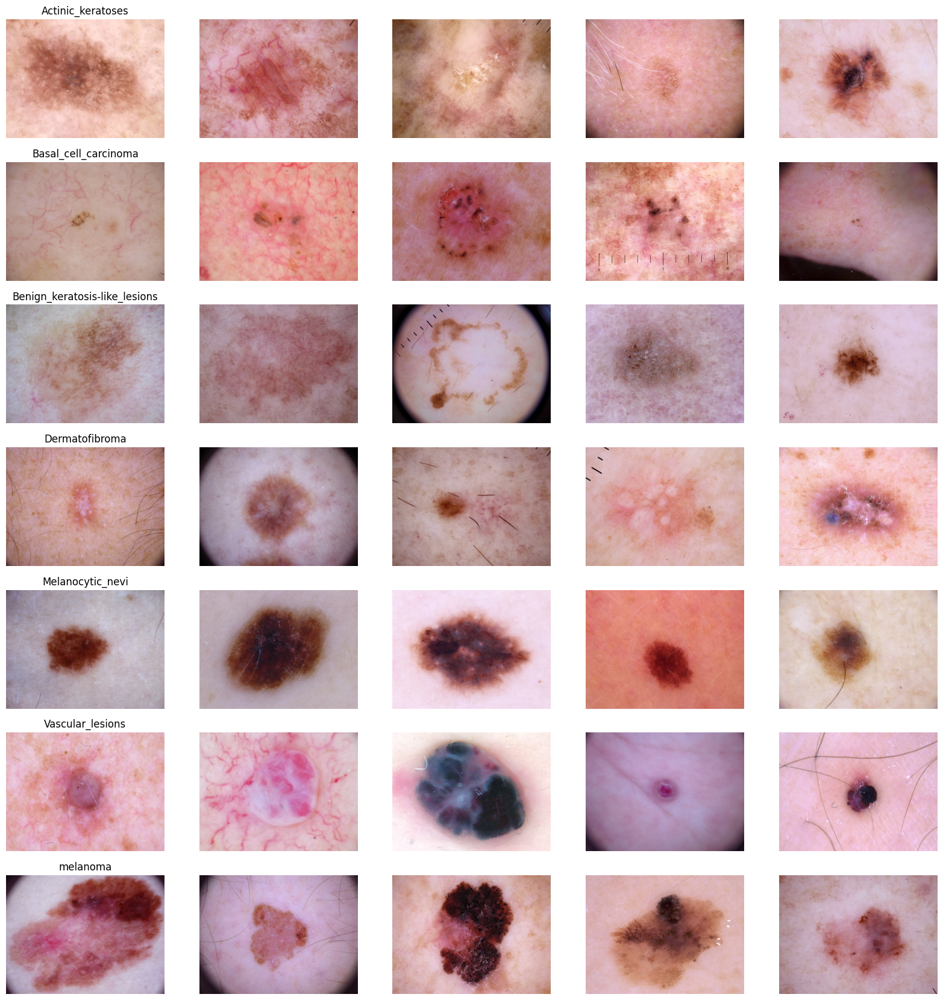

In [29]:
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4*n_samples, 3 * 7))

for n_axs, (type_name, type_rows) in zip(m_axs, df1.sort_values(["lesion_type"]).groupby("lesion_type")):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=0).iterrows()):
        c_ax.imshow(c_row["image"])
        c_ax.axis("off")
fig.savefig("category_samples.png", dpi=300)

In [30]:
df1["image"].map(lambda x: x.shape).value_counts()

,count
image,
"(450, 600, 3)",10015


In [31]:
import pandas as pd
from PIL import Image
import numpy as np

df1['image'] = df1['path'].map(lambda x: np.asarray(Image.open(x).resize((100, 75))))

print(df1['image'][0].shape)


(75, 100, 3)


array([[[190, 153, 194],
        [192, 154, 196],
        [191, 153, 195],
        ...,
        [194, 152, 161],
        [193, 151, 163],
        [196, 157, 169]],

       [[190, 146, 188],
        [191, 149, 185],
        [193, 154, 194],
        ...,
        [194, 152, 158],
        [193, 150, 160],
        [194, 153, 163]],

       [[190, 153, 189],
        [193, 154, 189],
        [195, 157, 196],
        ...,
        [194, 151, 155],
        [191, 147, 152],
        [188, 143, 151]],

       ...,

       [[171, 137, 172],
        [177, 143, 175],
        [182, 148, 176],
        ...,
        [188, 156, 180],
        [186, 154, 179],
        [185, 152, 176]],

       [[165, 131, 164],
        [171, 137, 167],
        [177, 141, 168],
        ...,
        [185, 152, 174],
        [184, 151, 174],
        [182, 149, 168]],

       [[159, 124, 155],
        [164, 127, 154],
        [169, 130, 153],
        ...,
        [186, 156, 184],
        [186, 157, 184],
        [180, 149, 166]]], dtype=uint8)
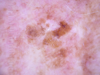

In [32]:
df1.iloc[0]["image"]

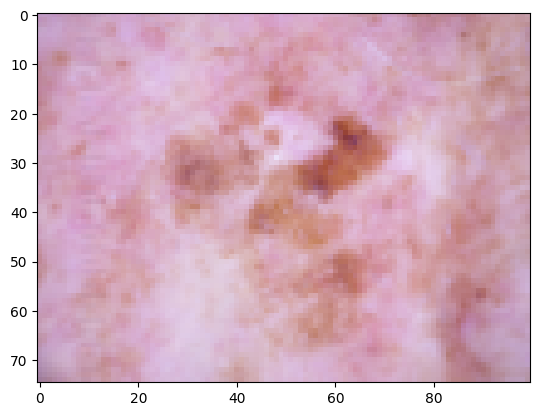

In [33]:
plt.imshow(df1['image'][0])
plt.show()

# Creating a Target Variable

In [34]:
features=df1.drop(columns=['lesion_ID'],axis=1)
target=df1['lesion_ID']

# Splitting into train,test and validation sets

In [35]:
x_train_o, x_test_o, y_train_o, y_test_o = train_test_split(features, target, test_size=0.20,random_state=1234)

# Normalizing the values

In [36]:
x_train = np.asarray(x_train_o['image'].tolist())
x_test = np.asarray(x_test_o['image'].tolist())

x_train_mean = np.mean(x_train)
x_train_std = np.std(x_train)

x_test_mean = np.mean(x_test)
x_test_std = np.std(x_test)

x_train = (x_train - x_train_mean)/x_train_std
x_test = (x_test - x_test_mean)/x_test_std

# One hot Encoding on Labels

In [37]:
y_train = to_categorical(y_train_o, num_classes = 7)
y_test = to_categorical(y_test_o, num_classes = 7)

In [38]:
x_train, x_validate, y_train, y_validate = train_test_split(x_train, y_train, test_size = 0.1, random_state = 2)

In [42]:
x_train = x_train.reshape(x_train.shape[0], 75, 100, 3)
x_test = x_test.reshape(x_test.shape[0], 75, 100, 3)
x_validate = x_validate.reshape(x_validate.shape[0], 75, 100, 3)


# Building a CNN architecture

In [43]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense


input_shape = (75, 100, 3)
num_classes = 7

model = Sequential()

# First Conv Block
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same', input_shape=input_shape))
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# Second Conv Block
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.40))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 75, 100, 32)    │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 75, 100, 32)    │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 37, 50, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 37, 50, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 37, 50, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 37, 50, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 18, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 18, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │     3,686,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,752,999 (14.32 MB)

 Trainable params: 3,752,999 (14.32 MB)

 Non-trainable params: 0 (0.00 B)

In [44]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

optimizer = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, decay=0.0, amsgrad=False)

model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])


learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=3,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)


/usr/local/lib/python3.11/dist-packages/keras/src/optimizers/base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


# Data Augmentation

In [45]:
datagen = ImageDataGenerator(
        featurewise_center=False,
        samplewise_center=False,
        featurewise_std_normalization=False,
        samplewise_std_normalization=False,
        zca_whitening=False,
        rotation_range=10,
        zoom_range = 0.1,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=False,
        vertical_flip=False)
datagen.fit(x_train)

In [46]:
epochs = 20
batch_size = 10
history = model.fit(datagen.flow(x_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = (x_validate,y_validate),
                              verbose = 1, steps_per_epoch=x_train.shape[0] // batch_size
                              , callbacks=[learning_rate_reduction])

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


721/721 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - accuracy: 0.6526 - loss: 1.0942 - val_accuracy: 0.6808 - val_loss: 0.9443 - learning_rate: 0.0010
Epoch 2/20
721/721 ━━━━━━━━━━━━━━━━━━━━ 13s 18ms/step - accuracy: 0.6571 - loss: 0.9585 - val_accuracy: 0.6808 - val_loss: 0.8768 - learning_rate: 0.0010
Epoch 3/20
721/721 ━━━━━━━━━━━━━━━━━━━━ 14s 19ms/step - accuracy: 0.6716 - loss: 0.8957 - val_accuracy: 0.6895 - val_loss: 0.8434 - learning_rate: 0.0010
Epoch 4/20
721/721 ━━━━━━━━━━━━━━━━━━━━ 14s 19ms/step - accuracy: 0.6723 - loss: 0.8980 - val_accuracy: 0.6820 - val_loss: 0.8588 - learning_rate: 0.0010
Epoch 5/20
721/721 ━━━━━━━━━━━━━━━━━━━━ 13s 18ms/step - accuracy: 0.6899 - loss: 0.8550 - val_accuracy: 0.7145 - val_loss: 0.7894 - learning_rate: 0.0010
Epoch 6/20
721/721 ━━━━━━━━━━━━━━━━━━━━ 13s 18ms/step - accuracy: 0.6933 - loss: 0.8278 - val_accuracy: 0.7120 - val_loss: 0.7843 - learning_rate: 0.0010
Epoch 7/20
721/721 ━━━━━━━━━━━━━━━━━━━━ 13s 18ms/step - accuracy: 0.7123 - loss: 0.7928

In [47]:
loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
loss_v, accuracy_v = model.evaluate(x_validate, y_validate, verbose=1)
print("Validation: accuracy = %f  ;  loss_v = %f" % (accuracy_v, loss_v))
print("Test: accuracy = %f  ;  loss = %f" % (accuracy, loss))
model.save("model.h5")

63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.7575 - loss: 0.6354
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7956 - loss: 0.5983


Validation: accuracy = 0.769327  ;  loss_v = 0.638472
Test: accuracy = 0.748877  ;  loss = 0.666706


63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


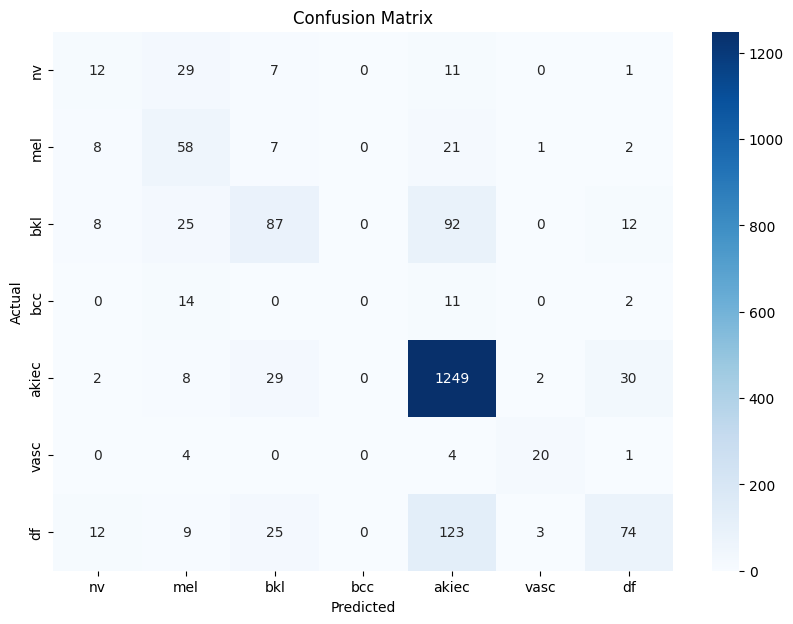

              precision    recall  f1-score   support

          nv       0.29      0.20      0.24        60
         mel       0.39      0.60      0.48        97
         bkl       0.56      0.39      0.46       224
         bcc       0.00      0.00      0.00        27
       akiec       0.83      0.95      0.88      1320
        vasc       0.77      0.69      0.73        29
          df       0.61      0.30      0.40       246

    accuracy                           0.75      2003
   macro avg       0.49      0.45      0.45      2003
weighted avg       0.72      0.75      0.72      2003



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [48]:

from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

y_pred = model.predict(x_test)
y_pred_classes = y_pred.argmax(axis=1)
y_true = y_test.argmax(axis=1)

cm = confusion_matrix(y_true, y_pred_classes)
labels = ['nv', 'mel', 'bkl', 'bcc', 'akiec', 'vasc', 'df']

plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

print(classification_report(y_true, y_pred_classes, target_names=labels))


# InceptionResNETV2

In [49]:
import os
import pandas as pd
import shutil
from tqdm import tqdm

base_skin_dir = '/content/dlprojdata/dlprojdata'
image_dir1 = os.path.join(base_skin_dir, 'HAM10000_images_part_1')
image_dir2 = os.path.join(base_skin_dir, 'HAM10000_images_part_2')
metadata_path = os.path.join(base_skin_dir, 'HAM10000_metadata.csv')
target_base = '/content/HAM_Dataset'

df = pd.read_csv(metadata_path)
df['image_id'] = df['image_id'] + ".jpg"

all_images_dir = '/content/all_images'
os.makedirs(all_images_dir, exist_ok=True)
for img_folder in [image_dir1, image_dir2]:
    for img in os.listdir(img_folder):
        shutil.copy(os.path.join(img_folder, img), os.path.join(all_images_dir, img))

for lesion in df['dx'].unique():
    os.makedirs(os.path.join(target_base, lesion.upper()), exist_ok=True)

for _, row in tqdm(df.iterrows(), total=len(df)):
    label = row['dx'].upper()
    img_name = row['image_id']
    src = os.path.join(all_images_dir, img_name)
    dst = os.path.join(target_base, label, img_name)
    if os.path.exists(src):
        shutil.copy(src, dst)

print(sorted(os.listdir(target_base)))


100%|██████████| 10015/10015 [00:08<00:00, 1182.13it/s]

['AKIEC', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'VASC']


In [50]:
import os

image_dir = '/content/all_images'

for image in os.listdir(image_dir):
    if not image.lower().endswith('.jpg'):
        os.remove(os.path.join(image_dir, image))

non_jpgs = [f for f in os.listdir(image_dir) if not f.lower().endswith('.jpg')]
if non_jpgs:
    print("Still present:", non_jpgs)
else:
    print("All files are .jpg")


All files are .jpg


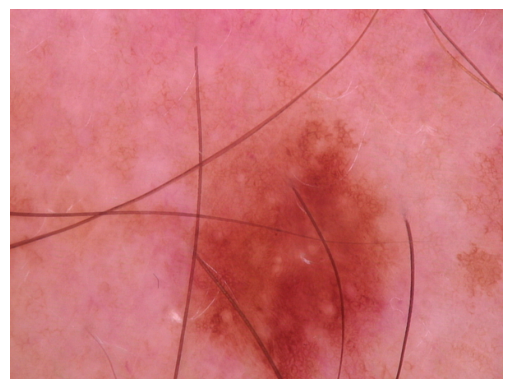

Image shape: (450, 600, 3)


In [51]:
import os
import cv2
import matplotlib.pyplot as plt

image_dir = '/content/all_images'

img = os.listdir(image_dir)[0]
skin = cv2.imread(os.path.join(image_dir, img))
plt.imshow(cv2.cvtColor(skin, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

print("Image shape:", skin.shape)


In [52]:
import pandas as pd

mapping = {0: "MEL", 1: "NV", 2: "BCC", 3: "AKIEC", 4: "BKL", 5: "DF", 6: "VASC"}

csv_path = "/content/isic_labels/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv"

df_labels = pd.read_csv(csv_path)

for i in range(len(df_labels)):
    labels = df_labels.iloc[i, 1:].tolist()
    if 1 in labels:
        df_labels.loc[i, "label"] = mapping[labels.index(1)]

df_labels.set_index('image', inplace=True)

df_labels.head()


,MEL,NV,BCC,AKIEC,BKL,DF,VASC,label
image,,,,,,,,
ISIC_0024306,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NV
ISIC_0024307,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NV
ISIC_0024308,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NV
ISIC_0024309,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NV
ISIC_0024310,1.0,0.0,0.0,0.0,0.0,0.0,0.0,MEL


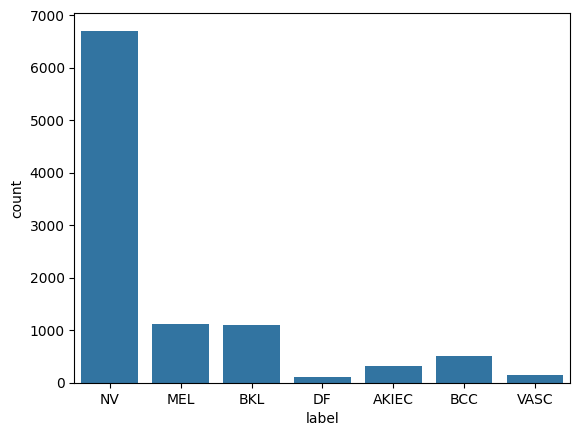

In [53]:
sns.countplot(x=df_labels["label"])
plt.show()

# Adding Class Weights

In [54]:
import numpy as np
from sklearn.utils import class_weight

class_list = ['AKIEC', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'VASC']

class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.array(class_list),
    y=df_labels["label"]
)

class_wt_dict = dict(zip(class_list, class_weights))
class_wt_dict


{'AKIEC': np.float64(4.375273044997815),
 'BCC': np.float64(2.78349082823791),
 'BKL': np.float64(1.301832835044846),
 'DF': np.float64(12.440993788819876),
 'MEL': np.float64(1.2854575792581184),
 'NV': np.float64(0.21338020666879728),
 'VASC': np.float64(10.075452716297788)}

In [55]:
import os

target_base = "HAM_Dataset"
os.makedirs(target_base, exist_ok=True)

for label in df_labels["label"].unique():
    os.makedirs(os.path.join(target_base, label), exist_ok=True)


In [56]:
import os
import shutil
from tqdm import tqdm

image_dir = '/content/all_images'
target_dir = '/content/HAM_Dataset'

os.makedirs(target_dir, exist_ok=True)
for label in df_labels["label"].unique():
    os.makedirs(os.path.join(target_dir, label), exist_ok=True)

images = os.listdir(image_dir)

for image in tqdm(images):
    fname = image[:-4]
    if fname in df_labels.index:
        label = df_labels.loc[fname, "label"]
        src = os.path.join(image_dir, image)
        dst = os.path.join(target_dir, label, image)
        if os.path.exists(src):
            shutil.copyfile(src, dst)


100%|██████████| 10015/10015 [00:06<00:00, 1503.46it/s]


In [65]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet_v2 import preprocess_input as base_preprocess


image_gen = ImageDataGenerator(
                               preprocessing_function=base_preprocess,
                               rotation_range=30,
                               width_shift_range=0.1,
                               height_shift_range=0.1,
                               shear_range=0.1,
                               zoom_range=0.2,
                               horizontal_flip=True,
                               fill_mode='nearest',
                               validation_split=0.15)

data_dir = 'HAM_Dataset'
batch_size = 32
target_size = (224,224)
train_image_gen = image_gen.flow_from_directory(data_dir,
                                          target_size=target_size,
                                          color_mode='rgb',
                                          batch_size=batch_size,
                                          class_mode='categorical',
                                          subset="training")

test_image_gen = image_gen.flow_from_directory(data_dir,
                                          target_size=target_size,
                                          color_mode='rgb',
                                          batch_size=batch_size,
                                          class_mode='categorical',
                                          shuffle=False,
                                          subset="validation")

print(test_image_gen.class_indices)

Found 8516 images belonging to 7 classes.
Found 1499 images belonging to 7 classes.
{'AKIEC': 0, 'BCC': 1, 'BKL': 2, 'DF': 3, 'MEL': 4, 'NV': 5, 'VASC': 6}


<Axes: ylabel='count'>

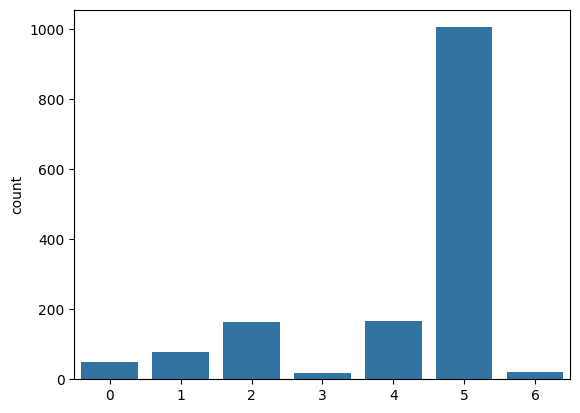

In [58]:
sns.countplot(x=test_image_gen.classes)

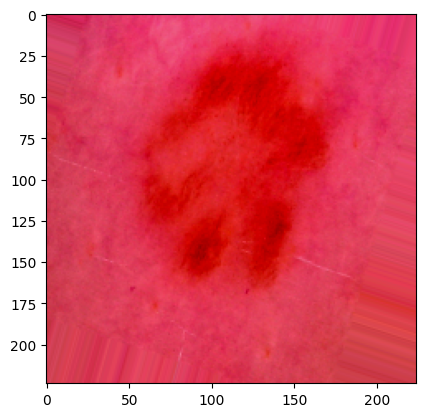

In [59]:
plt.imshow(train_image_gen[0][0][0])

In [60]:
from tensorflow.keras.applications import *
from tensorflow.keras.layers import Flatten, Dense, Input, Dropout,GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = True

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,kernel_regularizer='l2',activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(7, activation='softmax')(x)
tl_model = Model(inputs=base_model.input, outputs=x)


tl_model.summary()

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 111, 111,  │        864 │ input_layer_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 111, 111,  │         96 │ conv2d_12[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_13[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_14[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 54, 54,    │      5,120 │ max_pooling2d_6[… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_15[0][0]   │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_16[0][0]   │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 54,534,375 (208.03 MB)

 Trainable params: 54,473,831 (207.80 MB)

 Non-trainable params: 60,544 (236.50 KB)

In [61]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam

tl_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy']
)


In [62]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

lr_reduce = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.5,
    patience=2,
    mode='max',
    min_lr=1e-5,
    verbose=1
)

early_stop = EarlyStopping(
    monitor="val_loss",
    patience=2,
    verbose=1,
    restore_best_weights=True
)

model_chkpt = ModelCheckpoint(
    'best_model_incepresnetv2.keras',
    save_best_only=True,
    monitor='val_accuracy',
    mode='max',
    verbose=1
)

callback_list = [model_chkpt, lr_reduce, early_stop]


In [63]:
history = tl_model.fit(train_image_gen,
                       epochs=20,
                       validation_data = test_image_gen,
                       class_weight=class_wt_dict,
                       callbacks=callback_list)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 734ms/step - accuracy: 0.6606 - loss: 3.3956
Epoch 1: val_accuracy improved from -inf to 0.80253, saving model to best_model_incepresnetv2.keras
267/267 ━━━━━━━━━━━━━━━━━━━━ 396s 912ms/step - accuracy: 0.6608 - loss: 3.3942 - val_accuracy: 0.8025 - val_loss: 2.4601 - learning_rate: 1.0000e-04
Epoch 2/20
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.8227 - loss: 2.3161
Epoch 2: val_accuracy improved from 0.80253 to 0.81454, saving model to best_model_incepresnetv2.keras
267/267 ━━━━━━━━━━━━━━━━━━━━ 171s 638ms/step - accuracy: 0.8227 - loss: 2.3156 - val_accuracy: 0.8145 - val_loss: 2.1426 - learning_rate: 1.0000e-04
Epoch 3/20
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - accuracy: 0.8542 - loss: 1.7794
Epoch 3: val_accuracy improved from 0.81454 to 0.84523, saving model to best_model_incepresnetv2.keras
267/267 ━━━━━━━━━━━━━━━━━━━━ 170s 634ms/step - accuracy: 0.8542 - loss: 1.7791 - val_accuracy: 0.8452 - val_loss: 1.5269 - learning_

In [66]:
from tensorflow.keras.models import load_model
import numpy as np

inception_model = load_model("best_model_incepresnetv2.keras")

preds_incep = inception_model.predict(test_image_gen, verbose=1)

y_true = test_image_gen.classes
y_incep = np.argmax(preds_incep, axis=1)

print(" Inception Accuracy:", np.mean(y_incep == y_true))



/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


47/47 ━━━━━━━━━━━━━━━━━━━━ 41s 658ms/step
 Inception Accuracy: 0.9006004002668445


In [67]:
df=pd.DataFrame(tl_model.history.history)
df.to_csv('hist3.csv')

<Axes: >

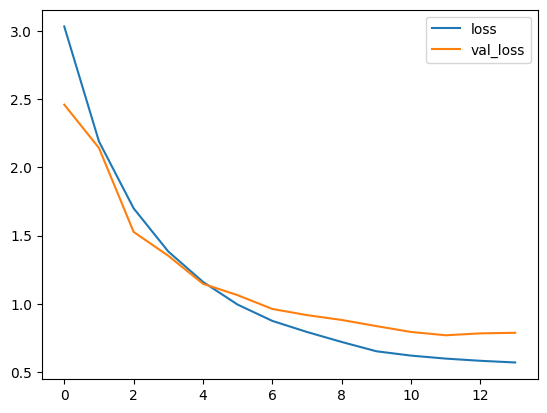

In [68]:
metrics = pd.DataFrame(tl_model.history.history)
metrics[["loss","val_loss"]].plot()

<Axes: >

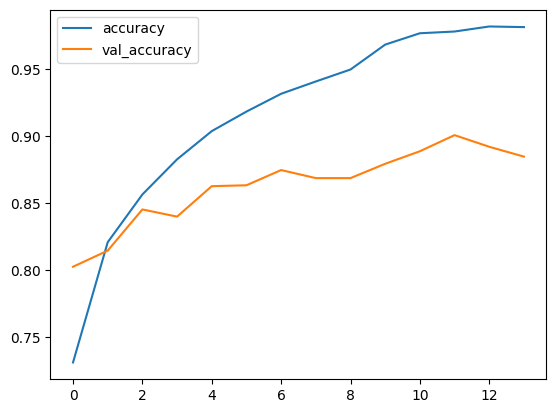

In [69]:
metrics[["accuracy","val_accuracy"]].plot()

In [70]:
predictions = tl_model.predict(test_image_gen, verbose=1)

y_pred = predictions.argmax(axis=1)
y_true = test_image_gen.classes


47/47 ━━━━━━━━━━━━━━━━━━━━ 42s 701ms/step


In [71]:
from sklearn.metrics import classification_report

index_to_label = {v: k for k, v in test_image_gen.class_indices.items()}

target_names = [index_to_label[i] for i in range(len(index_to_label))]

y_pred_classes = np.argmax(predictions, axis=1)

print(classification_report(y_pred, y_true, target_names=target_names))


              precision    recall  f1-score   support

       AKIEC       0.73      0.71      0.72        51
         BCC       0.87      0.89      0.88        75
         BKL       0.76      0.83      0.79       150
          DF       0.94      0.89      0.91        18
         MEL       0.66      0.79      0.72       139
          NV       0.98      0.94      0.96      1043
        VASC       0.90      0.83      0.86        23

    accuracy                           0.90      1499
   macro avg       0.84      0.84      0.84      1499
weighted avg       0.91      0.90      0.91      1499



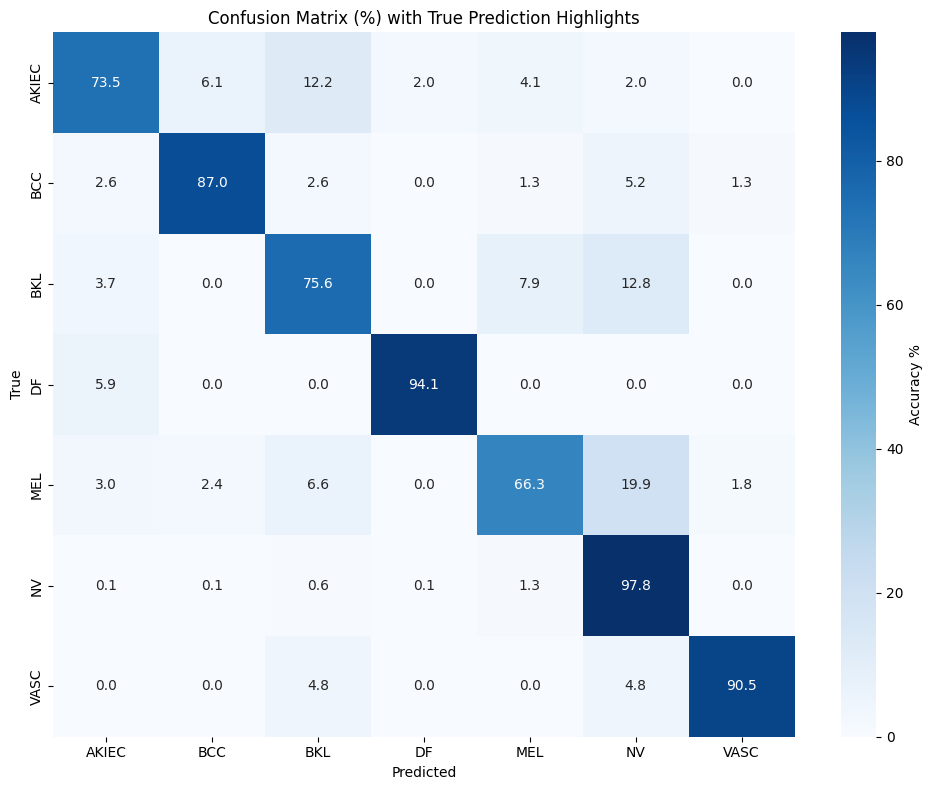

In [72]:
cm = confusion_matrix(y_true, y_pred_classes)
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]*100

plt.figure(figsize=(10, 8))
sns.heatmap(cm_percent, annot=True, fmt=".1f", cmap='Blues',
            xticklabels=target_names, yticklabels=target_names,
            cbar_kws={'label': 'Accuracy %'})
for i in range(len(cm)):
    plt.plot(i + 0.5, i + 0.5, color='blue', markersize=12)

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (%) with True Prediction Highlights')
plt.tight_layout()
plt.show()

In [73]:
from sklearn.metrics import roc_auc_score
import numpy as np
import tensorflow as tf

y_pred_proba = tl_model.predict(test_image_gen)

y_true = test_image_gen.classes
y_true_onehot = tf.keras.utils.to_categorical(y_true, num_classes=len(test_image_gen.class_indices))

auc_macro = roc_auc_score(y_true_onehot, y_pred_proba, average='macro', multi_class='ovr')
print(f"\n Macro-Averaged ROC AUC: {auc_macro:.4f}")

print("\n Per-Class ROC AUC:")
class_labels = list(test_image_gen.class_indices.keys())

for i, class_name in enumerate(class_labels):
    auc = roc_auc_score(y_true_onehot[:, i], y_pred_proba[:, i])
    print(f"{class_name.upper():<6} AUC: {auc:.4f}")


47/47 ━━━━━━━━━━━━━━━━━━━━ 22s 454ms/step

 Macro-Averaged ROC AUC: 0.9748

 Per-Class ROC AUC:
AKIEC  AUC: 0.9597
BCC    AUC: 0.9877
BKL    AUC: 0.9657
DF     AUC: 0.9994
MEL    AUC: 0.9401
NV     AUC: 0.9721
VASC   AUC: 0.9991


1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0

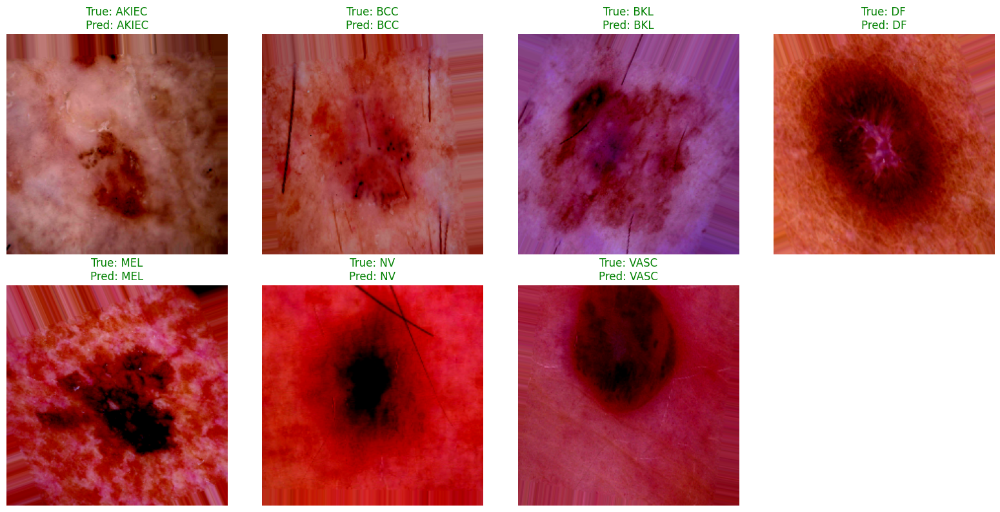

In [74]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

model = load_model("best_model_incepresnetv2.keras")

class_names = list(test_image_gen.class_indices.keys())
n_classes = len(class_names)

examples = {}

test_image_gen.reset()
for x_batch, y_batch in test_image_gen:
    preds = model.predict(x_batch)
    pred_classes = np.argmax(preds, axis=1)
    true_classes = np.argmax(y_batch, axis=1)

    for i in range(len(true_classes)):
        label = true_classes[i]
        if label not in examples:
            examples[label] = (x_batch[i], label, pred_classes[i])
        if len(examples) == n_classes:
            break
    if len(examples) == n_classes:
        break
plt.figure(figsize=(16, 8))
for idx, (label, (img, true_label, pred_label)) in enumerate(sorted(examples.items())):
    plt.subplot(2, (n_classes + 1) // 2, idx + 1)
    plt.imshow(img)
    color = 'green' if true_label == pred_label else 'red'
    plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}", color=color)
    plt.axis('off')

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


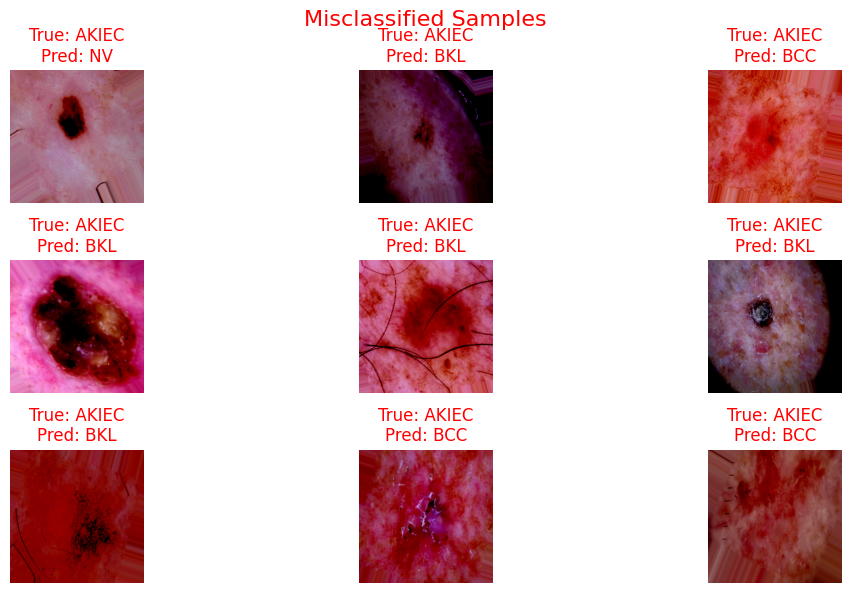

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

model = load_model("best_model_incepresnetv2.keras")

class_names = list(test_image_gen.class_indices.keys())

misclassified = []

test_image_gen.reset()
for x_batch, y_batch in test_image_gen:
    preds = model.predict(x_batch)
    pred_classes = np.argmax(preds, axis=1)
    true_classes = np.argmax(y_batch, axis=1)

    for i in range(len(true_classes)):
        if pred_classes[i] != true_classes[i]:
            misclassified.append((x_batch[i], true_classes[i], pred_classes[i]))

    if len(misclassified) >= 9:
        break

plt.figure(figsize=(12, 6))
for i in range(min(9, len(misclassified))):
    img, true_lbl, pred_lbl = misclassified[i]
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(f"True: {class_names[true_lbl]}\nPred: {class_names[pred_lbl]}", color='red')
    plt.axis('off')

plt.tight_layout()
plt.suptitle("Misclassified Samples", fontsize=16, color='red')
plt.subplots_adjust(top=0.88)
plt.show()


# EfficientNetB4

In [76]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import preprocess_input as base_preprocess


image_gen = ImageDataGenerator(
                               preprocessing_function=base_preprocess,
                               rotation_range=30,
                               width_shift_range=0.1,
                               height_shift_range=0.1,
                               shear_range=0.1,
                               zoom_range=0.2,
                               horizontal_flip=True,
                               fill_mode='nearest',
                               validation_split=0.15)


data_dir = 'HAM_Dataset'
batch_size = 32
target_size = (224,224)
train_image_gen = image_gen.flow_from_directory(data_dir,
                                          target_size=target_size,
                                          color_mode='rgb',
                                          batch_size=batch_size,
                                          class_mode='categorical',
                                          subset="training")

test_image_gen = image_gen.flow_from_directory(data_dir,
                                          target_size=target_size,
                                          color_mode='rgb',
                                          batch_size=batch_size,
                                          class_mode='categorical',
                                          shuffle=False,
                                          subset="validation")

print(test_image_gen.class_indices)

Found 8516 images belonging to 7 classes.
Found 1499 images belonging to 7 classes.
{'AKIEC': 0, 'BCC': 1, 'BKL': 2, 'DF': 3, 'MEL': 4, 'NV': 5, 'VASC': 6}


In [77]:
from tensorflow.keras.applications import *
from tensorflow.keras.layers import Flatten, Dense, Input, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

base_model3 = EfficientNetB4(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model3.layers:
    layer.trainable = True

x = base_model3.output
x = GlobalAveragePooling2D()(x)
x = Dense(256,kernel_regularizer='l2',activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(7, activation='softmax')(x)
t3_model = Model(inputs=base_model3.input, outputs=x)


t3_model.summary()

71686520/71686520 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_4[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │      1,296 │ stem_conv_pad[0]… │
│                     │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        192 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        432 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        192 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 48)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 48)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 12)  │        588 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 48)  │        624 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 48)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      1,152 │ block1a_se_excit

 Total params: 18,134,630 (69.18 MB)

 Trainable params: 18,009,423 (68.70 MB)

 Non-trainable params: 125,207 (489.09 KB)

In [78]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam

t3_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy'])


In [79]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

lr_reduce = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.5,
    patience=2,
    mode='max',
    min_lr=1e-5,
    verbose=1
)

early_stop = EarlyStopping(
    monitor="val_loss",
    patience=2,
    verbose=1,
    restore_best_weights=True
)

model_chkpt = ModelCheckpoint(
    'best_model_efficientnet.keras',
    save_best_only=True,
    monitor='val_accuracy',
    mode='max',
    verbose=1
)

callback_list = [model_chkpt, lr_reduce, early_stop]


In [80]:
history = t3_model.fit(train_image_gen,
                    epochs=20,
                    validation_data = test_image_gen,
                    class_weight=class_wt_dict,
                    callbacks=callback_list)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 691ms/step - accuracy: 0.6205 - loss: 5.3472
Epoch 1: val_accuracy improved from -inf to 0.77385, saving model to best_model_efficientnet.keras
267/267 ━━━━━━━━━━━━━━━━━━━━ 363s 852ms/step - accuracy: 0.6208 - loss: 5.3449 - val_accuracy: 0.7738 - val_loss: 3.7235 - learning_rate: 1.0000e-04
Epoch 2/20
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - accuracy: 0.7854 - loss: 3.3940
Epoch 2: val_accuracy improved from 0.77385 to 0.82121, saving model to best_model_efficientnet.keras
267/267 ━━━━━━━━━━━━━━━━━━━━ 150s 559ms/step - accuracy: 0.7854 - loss: 3.3929 - val_accuracy: 0.8212 - val_loss: 2.4923 - learning_rate: 1.0000e-04
Epoch 3/20
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - accuracy: 0.8373 - loss: 2.3061
Epoch 3: val_accuracy improved from 0.82121 to 0.84390, saving model to best_model_efficientnet.keras
267/267 ━━━━━━━━━━━━━━━━━━━━ 150s 561ms/step - accuracy: 0.8373 - loss: 2.3055 - val_accuracy: 0.8439 - val_loss: 1.8008 - learning_rat

In [82]:
from tensorflow.keras.models import load_model
import numpy as np

efficientnet_model = load_model("best_model_efficientnet.keras")

preds_incep = efficientnet_model.predict(test_image_gen, verbose=1)

y_true = test_image_gen.classes
y_incep = np.argmax(preds_incep, axis=1)

print(" EfficientNet Accuracy:", np.mean(y_incep == y_true))


47/47 ━━━━━━━━━━━━━━━━━━━━ 39s 638ms/step
 EfficientNet Accuracy: 0.9026017344896597


In [87]:
predictions = t3_model.predict(test_image_gen, verbose=1)
predictions = predictions.argmax(axis=1)

47/47 ━━━━━━━━━━━━━━━━━━━━ 21s 453ms/step


In [88]:
test_labels = test_image_gen.classes

In [89]:
from sklearn.metrics import classification_report

index_to_label = {v: k for k, v in test_image_gen.class_indices.items()}
target_names = [index_to_label[i] for i in range(len(index_to_label))]

print(classification_report(test_labels, predictions, target_names=target_names))


              precision    recall  f1-score   support

       AKIEC       0.79      0.61      0.69        49
         BCC       0.92      0.88      0.90        77
         BKL       0.80      0.76      0.78       164
          DF       0.53      1.00      0.69        17
         MEL       0.75      0.63      0.68       166
          NV       0.94      0.97      0.95      1005
        VASC       0.91      1.00      0.95        21

    accuracy                           0.89      1499
   macro avg       0.81      0.84      0.81      1499
weighted avg       0.89      0.89      0.89      1499



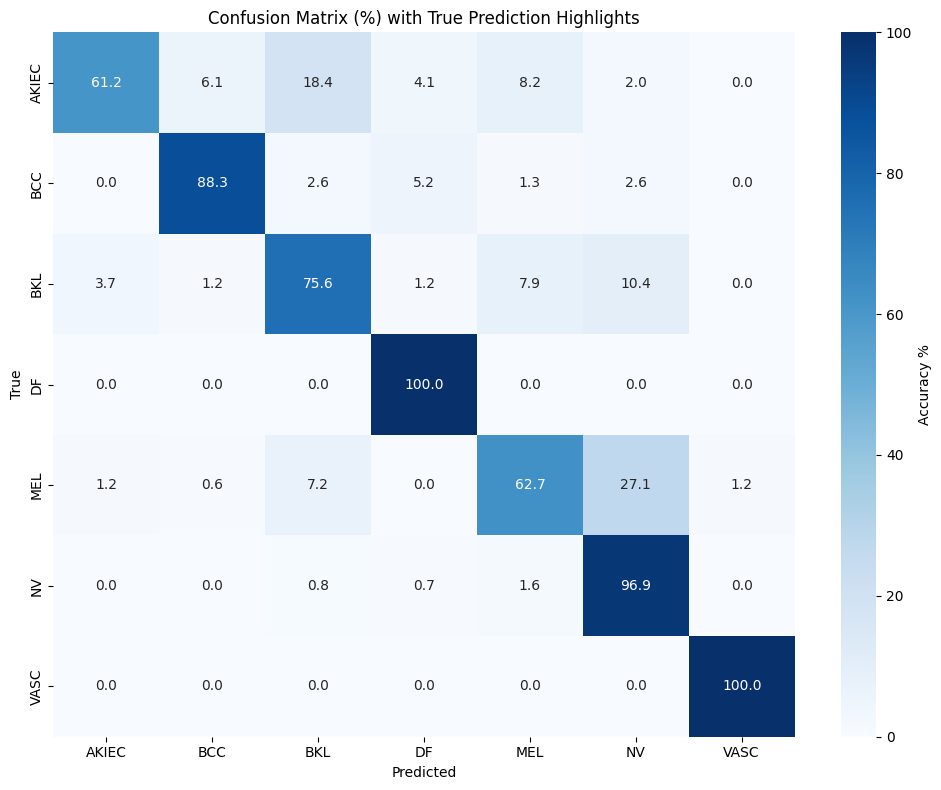

In [90]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

y_true = test_labels
y_pred = predictions

cm = confusion_matrix(y_true, y_pred)
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

plt.figure(figsize=(10, 8))
sns.heatmap(cm_percent, annot=True, fmt=".1f", cmap='Blues',
            xticklabels=target_names, yticklabels=target_names,
            cbar_kws={'label': 'Accuracy %'})
for i in range(len(cm)):
    plt.plot(i + 0.5, i + 0.5, color='blue', markersize=12)

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (%) with True Prediction Highlights')
plt.tight_layout()
plt.show()


In [91]:
from sklearn.metrics import roc_auc_score
import numpy as np
import tensorflow as tf

y_pred_proba = t3_model.predict(test_image_gen)

y_true = test_image_gen.classes
y_true_onehot = tf.keras.utils.to_categorical(y_true, num_classes=len(test_image_gen.class_indices))

auc_macro = roc_auc_score(y_true_onehot, y_pred_proba, average='macro', multi_class='ovr')
print(f"\n Macro-Averaged ROC AUC: {auc_macro:.4f}")

print("\n Per-Class ROC AUC:")
class_labels = list(test_image_gen.class_indices.keys())

for i, class_name in enumerate(class_labels):
    auc = roc_auc_score(y_true_onehot[:, i], y_pred_proba[:, i])
    print(f"{class_name.upper():<6} AUC: {auc:.4f}")


47/47 ━━━━━━━━━━━━━━━━━━━━ 21s 448ms/step

 Macro-Averaged ROC AUC: 0.9759

 Per-Class ROC AUC:
AKIEC  AUC: 0.9680
BCC    AUC: 0.9970
BKL    AUC: 0.9592
DF     AUC: 0.9990
MEL    AUC: 0.9400
NV     AUC: 0.9682
VASC   AUC: 0.9998


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

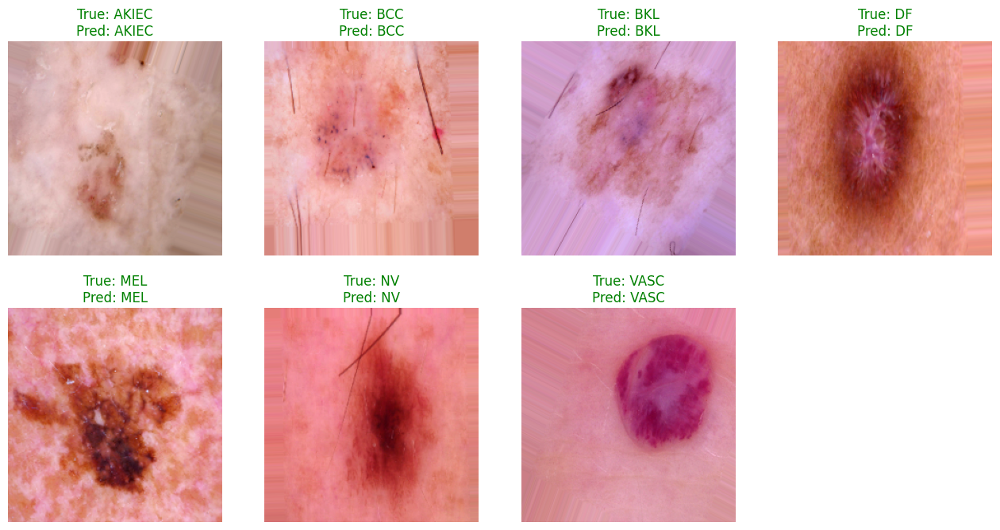

In [94]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

model = load_model("best_model_efficientnet.keras")

class_names = list(test_image_gen.class_indices.keys())
n_classes = len(class_names)

examples = {}

test_image_gen.reset()
for x_batch, y_batch in test_image_gen:
    preds = model.predict(x_batch)
    pred_classes = np.argmax(preds, axis=1)
    true_classes = np.argmax(y_batch, axis=1)

    for i in range(len(true_classes)):
        label = true_classes[i]
        if label not in examples:
            examples[label] = (x_batch[i], label, pred_classes[i])
        if len(examples) == n_classes:
            break
    if len(examples) == n_classes:
        break
plt.figure(figsize=(16, 8))
for idx, (label, (img, true_label, pred_label)) in enumerate(sorted(examples.items())):
    plt.subplot(2, (n_classes + 1) // 2, idx + 1)

    # FIX: rescale the image for display
    img = (img - img.min()) / (img.max() - img.min())

    plt.imshow(img)
    color = 'green' if true_label == pred_label else 'red'
    plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}", color=color)
    plt.axis('off')


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

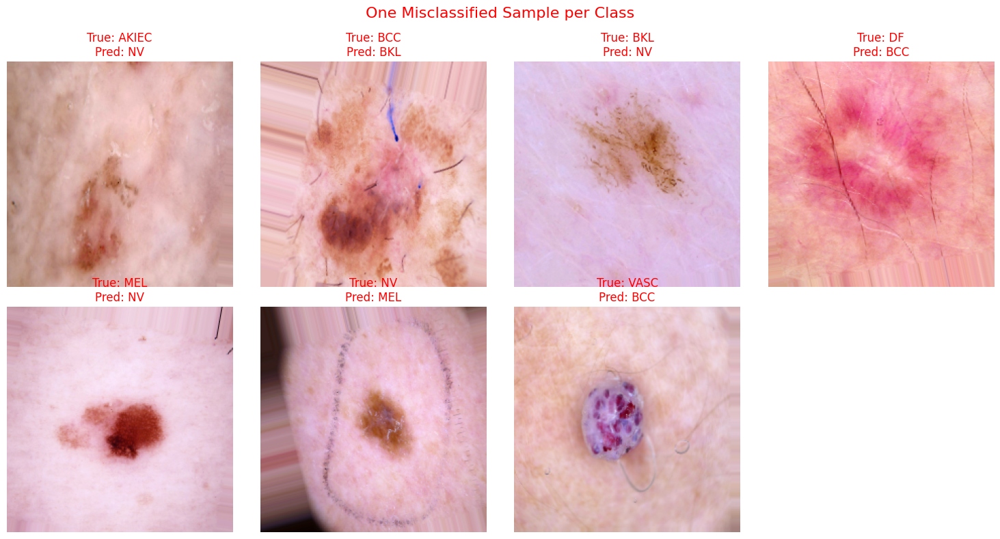

In [96]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load your trained model
model = load_model("best_model_efficientnet.keras")

# Get class names from generator
class_names = list(test_image_gen.class_indices.keys())
n_classes = len(class_names)

# Dictionary to store one misclassified image per class
misclassified = {}

# Reset generator for fresh batch reading
test_image_gen.reset()

# Loop through batches and collect misclassified examples
for x_batch, y_batch in test_image_gen:
    preds = model.predict(x_batch)
    pred_classes = np.argmax(preds, axis=1)
    true_classes = np.argmax(y_batch, axis=1)

    for i in range(len(true_classes)):
        true_lbl = true_classes[i]
        pred_lbl = pred_classes[i]

        if true_lbl != pred_lbl and true_lbl not in misclassified:
            misclassified[true_lbl] = (x_batch[i], true_lbl, pred_lbl)

        # Break early if all classes are covered
        if len(misclassified) == n_classes:
            break
    if len(misclassified) == n_classes:
        break

# Plotting
plt.figure(figsize=(15, 8))
for idx, (label, (img, true_lbl, pred_lbl)) in enumerate(sorted(misclassified.items())):
    img = (img - img.min()) / (img.max() - img.min())  # Normalize for display

    plt.subplot(2, (n_classes + 1) // 2, idx + 1)
    plt.imshow(img)
    plt.title(f"True: {class_names[true_lbl]}\nPred: {class_names[pred_lbl]}", color='red')
    plt.axis('off')

plt.tight_layout()
plt.suptitle("One Misclassified Sample per Class", fontsize=16, color='red')
plt.subplots_adjust(top=0.88)
plt.show()


# DenseNet

In [97]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.densenet import preprocess_input as base_preprocess


image_gen = ImageDataGenerator(preprocessing_function=base_preprocess,
                               rotation_range=20,
                               width_shift_range=0.1,
                               height_shift_range=0.1,
                               shear_range=0.1,
                               zoom_range=0.1,
                               horizontal_flip=True,
                               fill_mode='nearest',
                               validation_split=0.20)
data_dir = 'HAM_Dataset'
batch_size = 32
train_image_gen = image_gen.flow_from_directory(data_dir,
                                          target_size=(224,224),
                                          color_mode='rgb',
                                          batch_size=batch_size,
                                          class_mode='categorical',
                                          subset="training")

test_image_gen = image_gen.flow_from_directory(data_dir,
                                          target_size=(224,224),
                                          color_mode='rgb',
                                          batch_size=batch_size,
                                          class_mode='categorical',
                                          shuffle=False,
                                          subset="validation")

print(test_image_gen.class_indices)

Found 8015 images belonging to 7 classes.
Found 2000 images belonging to 7 classes.
{'AKIEC': 0, 'BCC': 1, 'BKL': 2, 'DF': 3, 'MEL': 4, 'NV': 5, 'VASC': 6}


In [98]:
from tensorflow.keras.applications import *
from tensorflow.keras.layers import Flatten, Dense, Input, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = True

x = base_model.output
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(7, activation='softmax')(x)
t4_model = Model(inputs=base_model.input, outputs=x)


t4_model.summary()
optimizer = Adam(0.0001)
t4_model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer_5[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 13,461,063 (51.35 MB)

 Trainable params: 13,377,415 (51.03 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [99]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint


lr_reduce = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.5,
    patience=2,
    mode='max',
    min_lr=1e-5,
    verbose=1
)


early_stop = EarlyStopping(
    monitor="val_loss",
    patience=2,
    verbose=1,
    restore_best_weights=True
)


model_chkpt = ModelCheckpoint(
    'Densenet.keras',
    save_best_only=True,
    monitor='val_accuracy',
    mode='max',
    verbose=1
)


callback_list = [model_chkpt, lr_reduce, early_stop]


In [100]:
history = t4_model.fit(train_image_gen,
                       epochs=20,
                       validation_data = test_image_gen,
                       callbacks=callback_list)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 884ms/step - accuracy: 0.6449 - loss: 1.2130
Epoch 1: val_accuracy improved from -inf to 0.76700, saving model to Densenet.keras
251/251 ━━━━━━━━━━━━━━━━━━━━ 446s 1s/step - accuracy: 0.6450 - loss: 1.2119 - val_accuracy: 0.7670 - val_loss: 0.6617 - learning_rate: 1.0000e-04
Epoch 2/20
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 503ms/step - accuracy: 0.7338 - loss: 0.7231
Epoch 2: val_accuracy improved from 0.76700 to 0.80300, saving model to Densenet.keras
251/251 ━━━━━━━━━━━━━━━━━━━━ 159s 634ms/step - accuracy: 0.7338 - loss: 0.7230 - val_accuracy: 0.8030 - val_loss: 0.6003 - learning_rate: 1.0000e-04
Epoch 3/20
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step - accuracy: 0.7759 - loss: 0.6135
Epoch 3: val_accuracy did not improve from 0.80300
251/251 ━━━━━━━━━━━━━━━━━━━━ 156s 619ms/step - accuracy: 0.7759 - loss: 0.6135 - val_accuracy: 0.8020 - val_loss: 0.5836 - learning_rate: 1.0000e-04
Epoch 4/20
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 502ms/step - accuracy: 0.80

In [101]:
from tensorflow.keras.models import load_model
import numpy as np

Densenet_model = load_model("Densenet.keras")

preds_incep = Densenet_model.predict(test_image_gen, verbose=1)

y_true = test_image_gen.classes
y_incep = np.argmax(preds_incep, axis=1)

print(" DenseNet Accuracy:", np.mean(y_incep == y_true))


63/63 ━━━━━━━━━━━━━━━━━━━━ 52s 648ms/step
 DenseNet Accuracy: 0.8185


In [102]:

predictions = t4_model.predict(test_image_gen, verbose=1)

y_pred = predictions.argmax(axis=1)

y_true = test_image_gen.classes


63/63 ━━━━━━━━━━━━━━━━━━━━ 50s 633ms/step


In [103]:
from sklearn.metrics import classification_report


index_to_label = {v: k for k, v in test_image_gen.class_indices.items()}

target_names = [index_to_label[i] for i in range(len(index_to_label))]

import numpy as np
y_pred_classes = np.argmax(predictions, axis=1)

print(classification_report(y_pred, y_true, target_names=target_names))


              precision    recall  f1-score   support

       AKIEC       0.42      0.54      0.47        50
         BCC       0.74      0.60      0.66       124
         BKL       0.76      0.58      0.66       287
          DF       0.35      0.89      0.50         9
         MEL       0.33      0.73      0.45       100
          NV       0.93      0.90      0.91      1395
        VASC       0.96      0.77      0.86        35

    accuracy                           0.81      2000
   macro avg       0.64      0.72      0.65      2000
weighted avg       0.85      0.81      0.82      2000



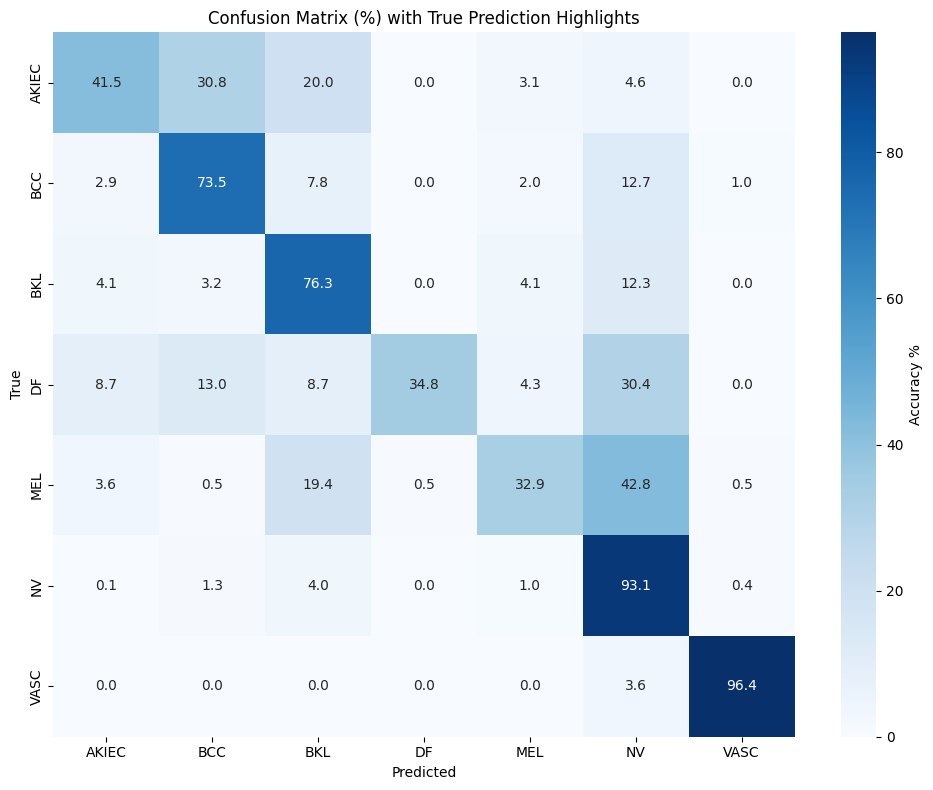

In [104]:

import sklearn
from sklearn.metrics import classification_report, confusion_matrix
cm = confusion_matrix(y_true, y_pred_classes)
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]*100

plt.figure(figsize=(10, 8))
sns.heatmap(cm_percent, annot=True, fmt=".1f", cmap='Blues',
            xticklabels=target_names, yticklabels=target_names,
            cbar_kws={'label': 'Accuracy %'})
for i in range(len(cm)):
    plt.plot(i + 0.5, i + 0.5, color='blue', markersize=12)

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (%) with True Prediction Highlights')
plt.tight_layout()
plt.show()

In [105]:
from sklearn.metrics import roc_auc_score
import numpy as np
import tensorflow as tf

y_pred_proba = t4_model.predict(test_image_gen)

y_true = test_image_gen.classes
y_true_onehot = tf.keras.utils.to_categorical(y_true, num_classes=len(test_image_gen.class_indices))
auc_macro = roc_auc_score(y_true_onehot, y_pred_proba, average='macro', multi_class='ovr')
print(f"\ Macro-Averaged ROC AUC: {auc_macro:.4f}")

print("\n Per-Class ROC AUC:")
class_labels = list(test_image_gen.class_indices.keys())

for i, class_name in enumerate(class_labels):
    auc = roc_auc_score(y_true_onehot[:, i], y_pred_proba[:, i])
    print(f"{class_name.upper():<6} AUC: {auc:.4f}")


63/63 ━━━━━━━━━━━━━━━━━━━━ 30s 481ms/step
\ Macro-Averaged ROC AUC: 0.9600

 Per-Class ROC AUC:
AKIEC  AUC: 0.9483
BCC    AUC: 0.9790
BKL    AUC: 0.9390
DF     AUC: 0.9814
MEL    AUC: 0.9189
NV     AUC: 0.9547
VASC   AUC: 0.9990
